In [ ]:
!pip install transformers
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
import transformers
from transformers import BertModel, BertTokenizer, AdamW, get_linear_schedule_with_warmup
import torch
import numpy as np
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from collections import defaultdict
from textwrap import wrap
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as f
import random

     |████████████████████████████████| 778kB 3.5MB/s 
     |████████████████████████████████| 890kB 20.5MB/s 
     |████████████████████████████████| 1.1MB 28.2MB/s 
     |████████████████████████████████| 3.0MB 34.9MB/s 
  Created wheel for sacremoses: filename=sacremoses-0.0.43-cp36-none-any.whl size=893260 sha256=1f72fe959136a92a18117f4c9bcf62c0fea9be033839e944082f6b36fffc9189
  Stored in directory: /root/.cache/pip/wheels/29/3c/fd/7ce5c3f0666dab31a50123635e6fb5e19ceb42ce38d4e58f45
Successfully built sacremoses


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
from google.colab import files
uploaded = files.upload()
# browse and upload the evaluation dataset.

Saving Evaluation-dataset.csv to Evaluation-dataset.csv


In [ ]:
df = pd.read_csv("Evaluation-dataset.csv", header = None)

In [ ]:
# Exploratory Data analysis
df.head(),df.shape, df.iloc[:,14].value_counts()

(                                                  0   ...   14
 0  Tires where delivered to the garage of my choi...  ...  NaN
 1  Easy Tyre Selection Process, Competitive Prici...  ...  NaN
 2         Very easy to use and good value for money.  ...  NaN
 3              Really easy and convenient to arrange  ...  NaN
 4  It was so easy to select tyre sizes and arrang...  ...  NaN
 
 [5 rows x 15 columns], (10132, 15), balancing positive    1
 Name: 14, dtype: int64)

In [ ]:
# finds sentiment substring in dataset and updates into a new dataframe column
def extract_sentiment(df):
    if "positive" in str(df):
        return "positive"
    if "negative" in str(df):
        return "negative"

df["sentiment"] = df.iloc[:,1].apply(extract_sentiment)

positive    6937
negative    1162
Name: sentiment, dtype: int64


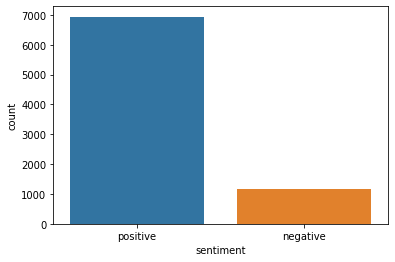

In [ ]:
# outputs sentiment count and plots a seaborn countplot for the same
def value_counts_sentiments(df):
    print(df.value_counts())
    return sns.countplot(df)

value_counts_sentiments(df["sentiment"])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10132 entries, 0 to 10131
Data columns (total 16 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   0          10132 non-null  object
 1   1          8129 non-null   object
 2   2          4239 non-null   object
 3   3          1538 non-null   object
 4   4          445 non-null    object
 5   5          128 non-null    object
 6   6          36 non-null     object
 7   7          13 non-null     object
 8   8          8 non-null      object
 9   9          4 non-null      object
 10  10         1 non-null      object
 11  11         1 non-null      object
 12  12         1 non-null      object
 13  13         1 non-null      object
 14  14         1 non-null      object
 15  sentiment  8099 non-null   object
dtypes: object(16)
memory usage: 1.2+ MB


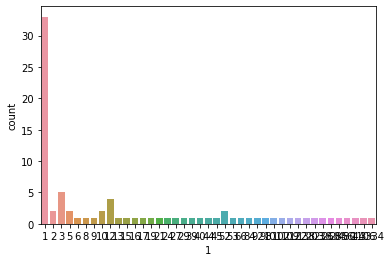

In [ ]:
# Two approaches to the problem
# 1) Multi label binary class classification ie. different labels + sentiments
# calculating the minimum number of unique multi-label binary classes
len(df.iloc[:,1].unique())
# the count plot for minimum different labels
sns.countplot(df.iloc[:,1].value_counts())
# there are minimum of 85 unique combinations of outputs for training 10K reviews.Therefore,
# this approach does not look feasible


# 2) Breaking problem into a supervised binary classification task and then appending
# labels according to hand engineered rules. Pre-requisites: Manual QA required for identifying patterns.
# Some rules identified are written below
# Price + positive - value for money positive
# Booked slot + negative - change of data negative
# near me/local + positive - location positive
# book + positive - ease of booking positive
# service + positive - garage service positive
# quality tyres + positive - tyre quality positive
# wait + negative - wait time negative
# staff/agent + positive - advisor/agent positive

# these rules can be worked upon to include all the root words

In [ ]:
# cleaning the database
# converting sentiments to numbers and making a new column for that
def sentiment_to_number(sentiment):
    sentiment = str(sentiment)
    if sentiment == 'positive':
        return 1
    elif sentiment == 'negative':
        return 0
    else:
        return -1

df['sentiment_binary'] = df['sentiment'].apply(sentiment_to_number)
df['sentiment_binary'] = df['sentiment_binary'].apply(lambda x: int(x))
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10132 entries, 0 to 10131
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   0                 10132 non-null  object
 1   1                 8129 non-null   object
 2   2                 4239 non-null   object
 3   3                 1538 non-null   object
 4   4                 445 non-null    object
 5   5                 128 non-null    object
 6   6                 36 non-null     object
 7   7                 13 non-null     object
 8   8                 8 non-null      object
 9   9                 4 non-null      object
 10  10                1 non-null      object
 11  11                1 non-null      object
 12  12                1 non-null      object
 13  13                1 non-null      object
 14  14                1 non-null      object
 15  sentiment         8099 non-null   object
 16  sentiment_binary  10132 non-null  int64 
dtypes: int64(1),

In [ ]:
df['sentiment'].value_counts()
# checking the value counts for any missing data
df["sentiment_binary"].value_counts()

 1    6937
-1    2033
 0    1162
Name: sentiment_binary, dtype: int64

In [ ]:
# over 2000 data points are missing (with label 0)
# the reviews are jumbeled up (some are not in their column), however I cannot find them all manually
# selecting the other ~ 8000 rows
df_clean=df[df["sentiment_binary"]!= -1]
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8099 entries, 0 to 10129
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   0                 8099 non-null   object
 1   1                 8099 non-null   object
 2   2                 4211 non-null   object
 3   3                 1518 non-null   object
 4   4                 436 non-null    object
 5   5                 125 non-null    object
 6   6                 34 non-null     object
 7   7                 12 non-null     object
 8   8                 7 non-null      object
 9   9                 3 non-null      object
 10  10                1 non-null      object
 11  11                1 non-null      object
 12  12                1 non-null      object
 13  13                1 non-null      object
 14  14                1 non-null      object
 15  sentiment         8099 non-null   object
 16  sentiment_binary  8099 non-null   int64 
dtypes: int64(1), 

In [ ]:
# checking the ratio of positives to negatives
df_clean["sentiment_binary"].value_counts()[1]/ df['sentiment_binary'].value_counts()[0]
# positive/ negative approximately equals 6
# therefore we need a method that will have the same ratio across different sets of training and validation dataset
# for this we will use startified k fold

5.969879518072289

In [ ]:
# splitting the Dataset
# 95% training data, 5% validation set. I am not taking test set here, since this is only a proof of concept.
def split_data(df):
    df_train, df_val = train_test_split(df,
    test_size = 0.1,
    random_state= RANDOM_SEED,
    stratify = df.sentiment_binary.values
    )
    return df_train,df_val
RANDOM_SEED = random.seed(123)
df_train,df_val=split_data(df_clean)
len(df_train), len(df_val)

(7289, 810)

In [ ]:
# checking the ratio of positives to negatives in training set
df_train["sentiment_binary"].value_counts()[1]/ df_train['sentiment_binary'].value_counts()[0]

# checking the ratio of positives to negatives in validation set
df_val["sentiment_binary"].value_counts()[1]/ df_val['sentiment_binary'].value_counts()[0]

# the ratio are same now

# rechecking if there is no review missing
df_train[0].isnull().value_counts()
df_val[0].isnull().value_counts()

False    810
Name: 0, dtype: int64

In [ ]:
# MODEL

# importing the preinstalled bert base uncased from the hugging face api
tokenizer = transformers.BertTokenizer.from_pretrained("bert-base-uncased")
# working with a sample text to ensure proper tranfer of model.
sample_txt = "This is an assignment for a startup. Here is the solution"
a=tokenizer.tokenize(sample_txt)
b= tokenizer.convert_tokens_to_ids(a)
assert (len(a)==len(b))
a,b

(['this',
  'is',
  'an',
  'assignment',
  'for',
  'a',
  'startup',
  '.',
  'here',
  'is',
  'the',
  'solution'],
 [2023, 2003, 2019, 8775, 2005, 1037, 22752, 1012, 2182, 2003, 1996, 5576])

In [ ]:
# checking tokens and their id's for encoding step
tokenizer.cls_token, tokenizer.cls_token_id
tokenizer.pad_token, tokenizer.pad_token_id
tokenizer.unk_token, tokenizer.unk_token_id


('[UNK]', 100)

In [ ]:
# encoding variable: will return padding and will return pytorch tensors.
encoding = tokenizer.encode_plus(
sample_txt,
max_length = 64,
add_special_tokens = True,
pad_to_max_length = True,
return_attention_mask = True,
return_tensors = "pt",
return_token_type_ids = True
)
# checking the output type of encoding
type(encoding)
# ensuring that the encoding is working properly
encoding.keys()
encoding.values()
encoding["input_ids"]
encoding["attention_mask"]


Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

In [ ]:
# Choosing sequence length of the encoder
token_len_reviews = list()
for txt in df[0]:
    tokens = tokenizer.encode(txt, max_length=512)
    token_len_reviews.append(len(tokens))

Streaming output truncated to the last 5000 lines.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' trun

Text(0, 0.5, 'Frequency')

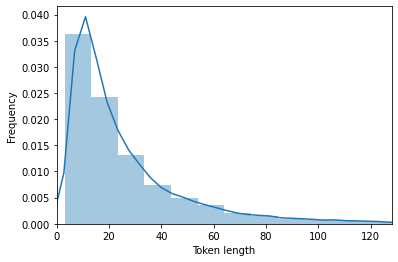

In [ ]:
sns.distplot(token_len_reviews)
plt.xlim([0,128])
plt.xlabel("Token length")
plt.ylabel("Frequency")
# most token lengths are below 100
# so 128 will be a good maximum sequence length for encoding bert-base-uncased


In [ ]:
MAX_LEN = 64
# reviewdataset class extends from the torch dataset api
# this will help in using the pytorch dataloader for the database, will make the whole training process more smooth

class reviewDataset(Dataset):
    # constructor
    def __init__(self, review, target, tokenizer, max_len):
        self.review = review
        self.target = target
        self.tokenizer = tokenizer
        self.max_len = max_len
    # outputs the length of the review
    def __len__(self):
        return len(self.review)
    # encodes the review and returns a dictionary of targets+inputs+attention masks
    def __getitem__(self, idx):
        review =  str(self.review[idx])

        encoding = tokenizer.encode_plus(
            review,
            max_length = self.max_len,
            add_special_tokens = True,
            pad_to_max_length = True,
            return_attention_mask = True,
            return_tensors = "pt",
            return_token_type_ids = True
        )
        return {
        'review_text':review,
        'input_ids':encoding['input_ids'].flatten(),
        'attention_mask':encoding['attention_mask'].flatten(),
        'targets':torch.tensor(self.target[idx], dtype = torch.long)
        }

BATCH_SIZE = 4
EPOCHS = 4

In [ ]:
# wrapping the data into pytorch DataLoader
# creates an instance for the reviewdataset class
def create_data_loader(df, tokenizer, max_len, batch_size):
  ds = reviewDataset(
    review=df[0].to_numpy(),
    target=df.sentiment_binary.to_numpy(),
    tokenizer=tokenizer,
    max_len= max_len
  )

  return DataLoader(
    ds,
    batch_size=BATCH_SIZE,
    num_workers=4
  )

train_data_loader = create_data_loader(df_train, tokenizer, MAX_LEN, BATCH_SIZE)
val_data_loader = create_data_loader(df_val, tokenizer, MAX_LEN, BATCH_SIZE)

In [ ]:
# checking out one of the example batch for our traning data loader
data=next(iter(train_data_loader))
data.keys()
len(next(iter(train_data_loader)))

data['input_ids'].shape
# 16 examples (batch size fixed as 16) with 128 tokens including padding
data['attention_mask'].shape
data['targets'].shape

Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (

torch.Size([4])

In [ ]:
PRE_TRAINED_MODEL_NAME = 'bert-base-uncased'
bert_model = BertModel.from_pretrained(PRE_TRAINED_MODEL_NAME)
# hidden state of the last attention head and then obtaining the pooled output for the same
# checking if the model has been correctly transferred
last_hidden_state, pooled_output = bert_model(
  input_ids=encoding['input_ids'],
  attention_mask=encoding['attention_mask']
)
last_hidden_state.shape
# hidden state for all 64 rokens . The nn architecture has 768 hidden units
#pooled_output is the summary statistic of each activation of the last hidden layer state
pooled_output.shape
bert_model.config.hidden_size

768

In [ ]:
# drop out hyper-parameter is 0.25
# the class extends from the pytorchs nn.module api and constructor instatiates the model and last layer shape.
# the forward function can be used to output the last last layer actvation and pooled activation output.
#since log loss would be used pooled activation is not important
class SentimentClassifier(nn.Module):

  def __init__(self, n_classes):
    super(SentimentClassifier, self).__init__()
    self.bert = BertModel.from_pretrained(PRE_TRAINED_MODEL_NAME)
    self.drop = nn.Dropout(p=0.25)
    self.out = nn.Linear(self.bert.config.hidden_size, n_classes)

  def forward(self, input_ids, attention_mask):
    _, pooled_output = self.bert(
      input_ids=input_ids,
      attention_mask=attention_mask
    )
    output = self.drop(pooled_output)
    return self.out(output)


In [ ]:
# creating an instance for the SentimentClassifier class
class_names = ["0","1"]
model = SentimentClassifier(len(class_names))

In [ ]:
# RuntimeError: CUDA error: device-side assert triggered, does not occur when using floydhub.
# it ried it using only cpu.
device = torch.device("cuda")
device

device(type='cuda')

In [ ]:
# sending the model instance to cpu
model = model.to(device)

In [ ]:
# sending an example batch by the name 'data' created earlier to the gpu

input_ids = data['input_ids'].to(device)
attention_mask = data['attention_mask'].to(device)

input_ids.shape
attention_mask.shape


torch.Size([4, 64])

In [ ]:
# apply softmax to last activations to get the predicted probabilites from the example batch

f.softmax(model(input_ids, attention_mask), dim=1)


tensor([[0.3797, 0.6203],
        [0.4600, 0.5400],
        [0.5272, 0.4728],
        [0.3396, 0.6604]], device='cuda:0', grad_fn=<SoftmaxBackward>)

In [ ]:
# epochs have already been set as 4
# taking AdamW optimizer from transformers library
# learning rate hyper paramter has been fixed at 2e-5
# depending on the training and validation accuracy hyper parameters can be changed
optimizer = AdamW(model.parameters(), lr=2e-5, correct_bias=False)
total_steps = len(train_data_loader) * EPOCHS

# define the scheduler. Warmup step hyper paramter can be adjusted accordingly
scheduler = get_linear_schedule_with_warmup(
  optimizer,
  num_warmup_steps=0,
  num_training_steps=total_steps
)

# Since it's binary classification using log loss makes sense.
loss_fn = nn.CrossEntropyLoss().to(device)
# below are the hyper parameters suggested by the BERT authors.
#    Batch size: 16, 32
#    Learning rate (Adam): 5e-5, 3e-5, 2e-5
#    Number of epochs: 2, 3, 4

In [ ]:
# A basic training function.
# every time a bacth is fed, loss is computed, optimizer and scheduler are called and updation takes place.
def train_epoch(
  model,
  data_loader,
  loss_fn,
  optimizer,
  device,
  scheduler,
  n_examples
):
  model = model.train()

  losses = []
  correct_predictions = 0

  for d in data_loader:
    input_ids = d["input_ids"].to(device)
    attention_mask = d["attention_mask"].to(device)
    targets = d["targets"].to(device)

    outputs = model(
      input_ids=input_ids,
      attention_mask=attention_mask
    )

    _, preds = torch.max(outputs, dim=1)
    loss = loss_fn(outputs, targets)

    correct_predictions += torch.sum(preds == targets)
    losses.append(loss.item())

    loss.backward()
    nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
    # clipping gradients for avoiding exploding and imploding gradients
    optimizer.step()
    scheduler.step()
    optimizer.zero_grad()

  return correct_predictions.double() / n_examples, np.mean(losses)


In [ ]:
# similar to the train function except their is no loss computed and no updation of weights
def eval_model(model, data_loader, loss_fn, device, n_examples):
  model = model.eval()

  losses = []
  correct_predictions = 0

  with torch.no_grad():
    for d in data_loader:
      input_ids = d["input_ids"].to(device)
      attention_mask = d["attention_mask"].to(device)
      targets = d["targets"].to(device)

      outputs = model(
        input_ids=input_ids,
        attention_mask=attention_mask
      )
      _, preds = torch.max(outputs, dim=1)

      loss = loss_fn(outputs, targets)

      correct_predictions += torch.sum(preds == targets)
      losses.append(loss.item())

  return correct_predictions.double() / n_examples, np.mean(losses)


In [ ]:
%%time

history = defaultdict(list)
best_accuracy = 0

for epoch in range(EPOCHS):

  print(f'Epoch {epoch + 1}/{EPOCHS}')
  print('-' * 10)

  train_acc, train_loss = train_epoch(
    model,
    train_data_loader,
    loss_fn,
    optimizer,
    device,
    scheduler,
    len(df_train)
  )

  print(f'Train loss {train_loss} accuracy {train_acc}')

  val_acc, val_loss = eval_model(
    model,
    val_data_loader,
    loss_fn,
    device,
    len(df_val)
  )

  print(f'Val   loss {val_loss} accuracy {val_acc}')
  print()

  history['train_acc'].append(train_acc)
  history['train_loss'].append(train_loss)
  history['val_acc'].append(val_acc)
  history['val_loss'].append(val_loss)

  if val_acc > best_accuracy:
    torch.save(model.state_dict(), 'best_model_state.bin')
    best_accuracy = val_acc


Epoch 1/4
----------


Streaming output truncated to the last 5000 lines.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' trun

Train loss 0.29152664022505625 accuracy 0.9231719028673343


Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (

Val   loss 0.20781670617349124 accuracy 0.945679012345679

Epoch 2/4
----------


Streaming output truncated to the last 5000 lines.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' trun

Train loss 0.17734572421732386 accuracy 0.9598024420359446


Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (

Val   loss 0.23935814481171241 accuracy 0.945679012345679

Epoch 3/4
----------


Streaming output truncated to the last 5000 lines.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' trun

Train loss 0.11939247412190648 accuracy 0.975991219646042


Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (

Val   loss 0.2863781367846664 accuracy 0.9395061728395061

Epoch 4/4
----------


Streaming output truncated to the last 5000 lines.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' trun

Train loss 0.06659543719818466 accuracy 0.988201399368912


Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (

Val   loss 0.31836046497658665 accuracy 0.9419753086419753

CPU times: user 33min 13s, sys: 9min 40s, total: 42min 53s
Wall time: 44min 14s


Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitely activated but `max_length` is provided a specific value, please use `truncation=True` to explicitely truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (

0.9419753086419753

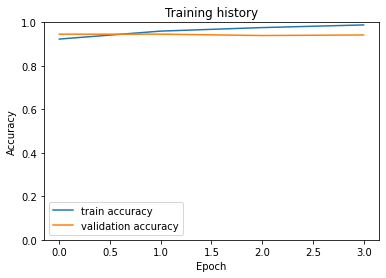

In [ ]:
# plotting training vs validation accuracy
plt.plot(history['train_acc'], label='train accuracy')
plt.plot(history['val_acc'], label='validation accuracy')
plt.title('Training history')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.ylim([0, 1])

# evaluating the prediction on the val set 

eval_acc, _ = eval_model(
  model,
  val_data_loader,
  loss_fn,
  device,
  len(df_val)
)
eval_acc.item()
# base on the training accuracy and validation accuracy we can see whether the model underfits or overfits.
# if the model underfits then we can increase the epoch and minimize the batch max_len of the batches
# if the model overfits then we can increase the dropout probability. This can also be achieved through using
# other hyperparameter tuning methods.






In [ ]:
# TODO:
# for percision, recall, f1 score
# I will use the sklearn classification_report
eval_acc.item()

0.9419753086419753

In [ ]:
#TODO:

# Assigning a column to the predictions
# using a rule based system for identifying the labels in subtheme
# some hand enginered rules are:

# Price + positive - value for money positive
# Booked slot + negative - change of data negative
# near me/local + positive - location positive
# book + positive - ease of booking positive
# service + positive - garage service positive
# quality tyres + positive - tyre quality positive
# wait + negative - wait time negative
# staff/agent + positive - advisor/agent positive

# using the regex and spacy packages to identify keywords in the review text
# acccordingly outputting the labels

In [ ]:
# The model has already been saved in the google drive
# accessing the parameters to ensure correct loading
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
# validating the regular expression model
# testing the working of regex

import re
result = re.match("serv.+","the servicing was great")
# testing regex
re.match("pric.+","great pricing")
result2=re.match("near.*|locat.*","bnmfj")
result2

In [ ]:
# TODO hand crafting regex expressions as done above and running them on the validation set predictions
# shortfall of current method : the current rules are not robust enough to incorporate spelling mistakes of these keywords 

<_sre.SRE_Match object; span=(0, 40), match='service provided is good, goiod services'>